In [28]:
# Basic packages
import numpy as np
from matplotlib import pyplot as plt
import xarray as xr
import pandas as pd
import math


# DateTime packages
from matplotlib.dates import DateFormatter
from datetime import datetime, timedelta
import time
import matplotlib.dates as mdates

# Stats packages
import scipy
import bottleneck as bn
import PyCO2SYS as pyco2
import gsw
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
import seaborn as sns
import pyleoclim as pyleo
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Logistical packages
import requests
from importlib import reload
import warnings
warnings.filterwarnings('ignore')

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker

In [9]:
df = pd.read_csv('/Users/akbaskind/Desktop/Data/CODAP_NA_v2021.csv')

In [67]:
df.keys()

Index(['Accession', 'EXPOCODE', 'Cruise_flag', 'Cruise_ID', 'Observation_type',
       'Profile_number', 'Station_ID', 'Cast_number', 'Niskin_ID',
       'Niskin_flag', 'Sample_ID', 'Year_UTC', 'Month_UTC', 'Day_UTC',
       'Time_UTC', 'Latitude', 'Longitude', 'Depth_bottom', 'Max_sample_depth',
       'CTDPRES', 'Depth', 'CTDTEMP_ITS90', 'CTDTEMP_flag', 'CTDSAL_PSS78',
       'CTDSAL_flag', 'Salinity_PSS78', 'Salinity_flag',
       'recommended_Salinity_PSS78', 'recommended_Salinity_flag', 'CTDOXY',
       'CTDOXY_flag', 'Oxygen', 'Oxygen_flag', 'recommended_Oxygen',
       'recommended_Oxygen_flag', 'AOU', 'AOU_flag', 'DIC', 'DIC_flag', 'TALK',
       'TALK_flag', 'pH_TS_measured', 'TEMP_pH', 'pH_flag',
       'pH_TS_insitu_measured', 'pH_TS_insitu_calculated', 'fCO2_measured',
       'TEMP_fCO2', 'fCO2_flag', 'fCO2_insitu_measured',
       'fCO2_insitu_calculated', 'Carbonate_measured', 'TEMP_Carbonate',
       'Carbonate_flag', 'Carbonate_insitu_measured',
       'Carbonate_insitu

In [93]:
DIC = pd.to_numeric(df['DIC'][1:])
long = pd.to_numeric(df['Longitude'][1:])
lat = pd.to_numeric(df['Latitude'][1:])
Si = pd.to_numeric(df['Silicate'][1:])
no3 = pd.to_numeric(df['Nitrate'][1:])
o2 = pd.to_numeric(df['Oxygen'][1:])
TA = pd.to_numeric(df['TALK'][1:])
po4 = pd.to_numeric(df['Phosphate'][1:])
nh4 = pd.to_numeric(df['Ammonium'][1:])
z = pd.to_numeric(df['Depth'][1:])
month = pd.to_numeric(df['Month_UTC'][1:])

In [94]:
TA[TA < 0] = np.nan
Si[Si < 0] = np.nan
no3[no3 < 0] = np.nan
nh4[nh4 < 0] = np.nan
po4[po4 < 0] = np.nan
o2[o2 < 0] = np.nan
DIC[DIC < 0] = np.nan

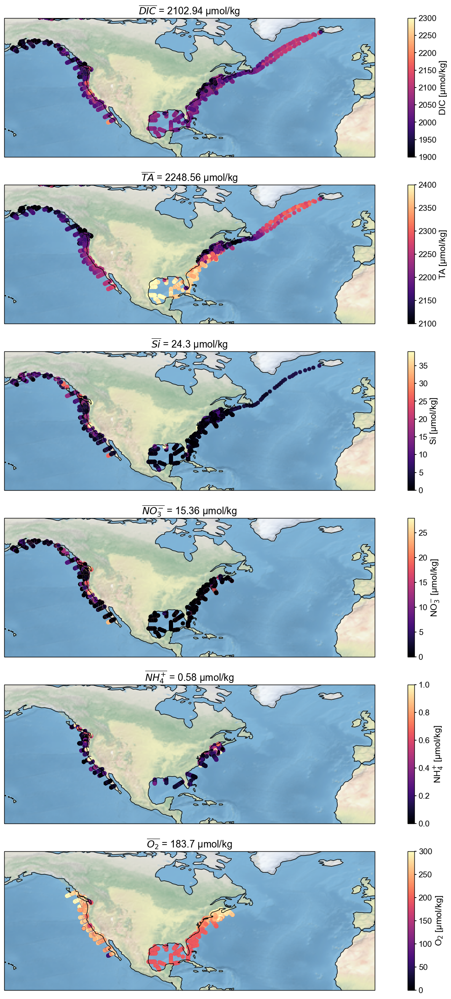

In [202]:
fig, axarr = plt.subplots(nrows = 6, figsize=[20,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [DIC, TA, Si, no3, nh4, o2]
labs = [r'$\overline{DIC}$ = ', r'$\overline{TA}$ = ', r'$\overline{Si}$ = ', 
        r'$\overline{NO_3^{-}}$ = ', r'$\overline{NH_4^{+}}$ = ', r'$\overline{O_2}$ = ']
clabs = ['DIC [µmol/kg]', 'TA [µmol/kg]', 'Si [µmol/kg]', r'NO$_3^{-}$ [µmol/kg]', r'NH$_4^{+}$ [µmol/kg]', r'O$_2$ [µmol/kg]']
m = 0
for ax in axarr:
    dat = data[m]
    ax.coastlines()
    ax.stock_img()
    ax.set_extent([0, -160, 10, 70], crs=ccrs.PlateCarree())
    if m < 2:
        MAX = round(dat.quantile(0.95),-2)
        MIN = round(dat.quantile(0.05),-2)
    elif m < 5:
        MAX = round(dat.quantile(0.8))
        MIN = round(dat.quantile(0.05))
    else:
        MAX = round(dat.quantile(0.95),-2)
        MIN = round(dat.quantile(0.05),-2)
    im = ax.scatter(long,lat, c = dat, vmin = MIN, vmax = MAX, cmap = 'magma')
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1

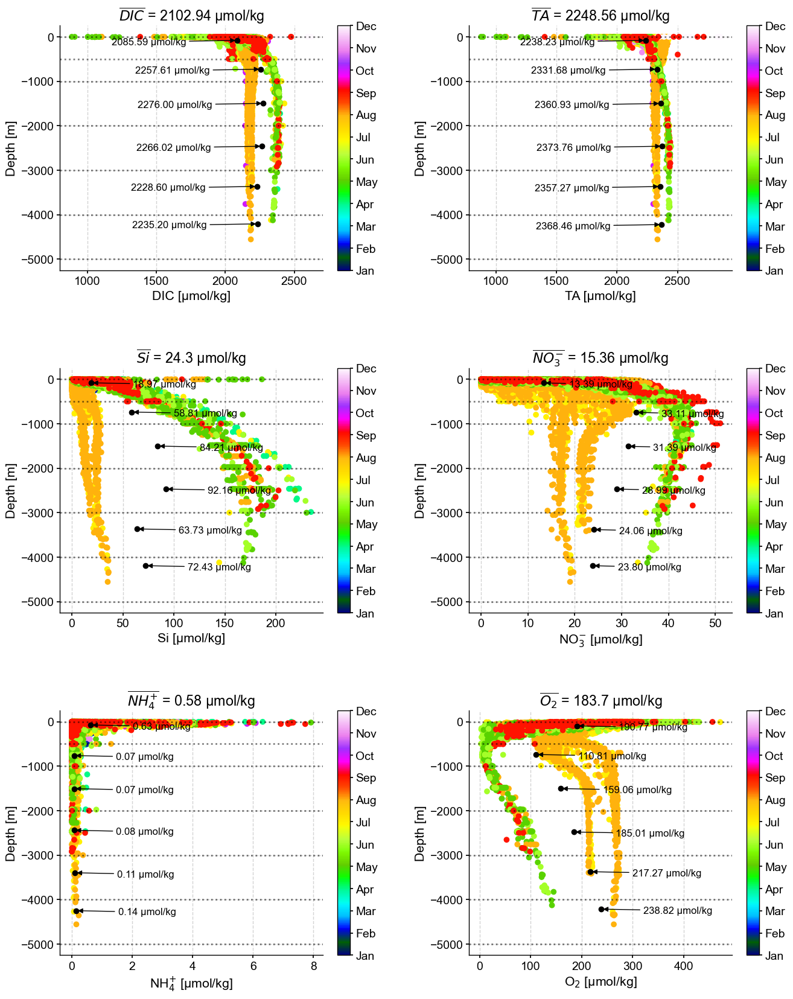

In [208]:
fig, axarr = plt.subplots(nrows = 3, ncols = 2, figsize=[15,20])
axarr = axarr.flatten()
plt.subplots_adjust(hspace=0.4, wspace = 0.4)

data = [DIC, TA, Si, no3, nh4, o2]
labs = [r'$\overline{DIC}$ = ', r'$\overline{TA}$ = ', r'$\overline{Si}$ = ', 
        r'$\overline{NO_3^{-}}$ = ', r'$\overline{NH_4^{+}}$ = ', r'$\overline{O_2}$ = ']
clabs = ['DIC [µmol/kg]', 'TA [µmol/kg]', 'Si [µmol/kg]', r'NO$_3^{-}$ [µmol/kg]', r'NH$_4^{+}$ [µmol/kg]', r'O$_2$ [µmol/kg]']
m = 0
for ax in axarr:
    dat = data[m]
    im = ax.scatter(dat, -z, c = month, cmap = 'gist_ncar', vmin = 1, vmax = 12)
    cbar = plt.colorbar(im, ax= ax, fraction = 0.05)
    cbar.set_ticks([1,2,3,4,5,6,7,8,9,10,11,12])
    cbar.set_ticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    MEAN = labs[m] + str(round(np.nanmean(dat),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    ax.set_xlabel(clabs[m])
    ax.set_ylabel('Depth [m]')
    
    temp = {'Data': dat, 'Depth': z}
    bin_df = pd.DataFrame(temp).dropna()
    x = bin_df['Data']
    y = bin_df['Depth']
    bins = [0,500,1000,2000,3000,4000,5000]
    for item in bins:
        ax.axhline(-item, color = 'k', linestyle = 'dotted', alpha = 0.5)
    bin_means = binned_statistic(y, x, bins=bins).statistic
    z_means = binned_statistic(y, y, bins=bins).statistic
    ax.scatter(bin_means, -z_means, c = 'k')
    if m < 2:
        offset = -150
    elif m == 3:
        offset = 30
    else:
        offset = 50
    for x,y in zip(bin_means, -z_means):                                       # <--
        ax.annotate('%0.2f µmol/kg' % (x), xy=(x,y), xytext=(offset,-5), textcoords='offset points', 
                    arrowprops={'arrowstyle': '-|>', 'color': 'black'}, fontsize = 12) # <--
    m = m + 1

In [210]:
DICdf = xr.open_mfdataset('/Users/akbaskind/Desktop/Data/DIC_median_historical.nc')
TAdf = xr.open_mfdataset('/Users/akbaskind/Desktop/Data/TA_median_historical.nc')
pHdf = xr.open_mfdataset('/Users/akbaskind/Desktop/Data/pHT_median_historical.nc')

In [214]:
DICdf = DICdf.isel(time = 17)
TAdf = TAdf.isel(time = 17)
pHdf = pHdf.isel(time = 17)

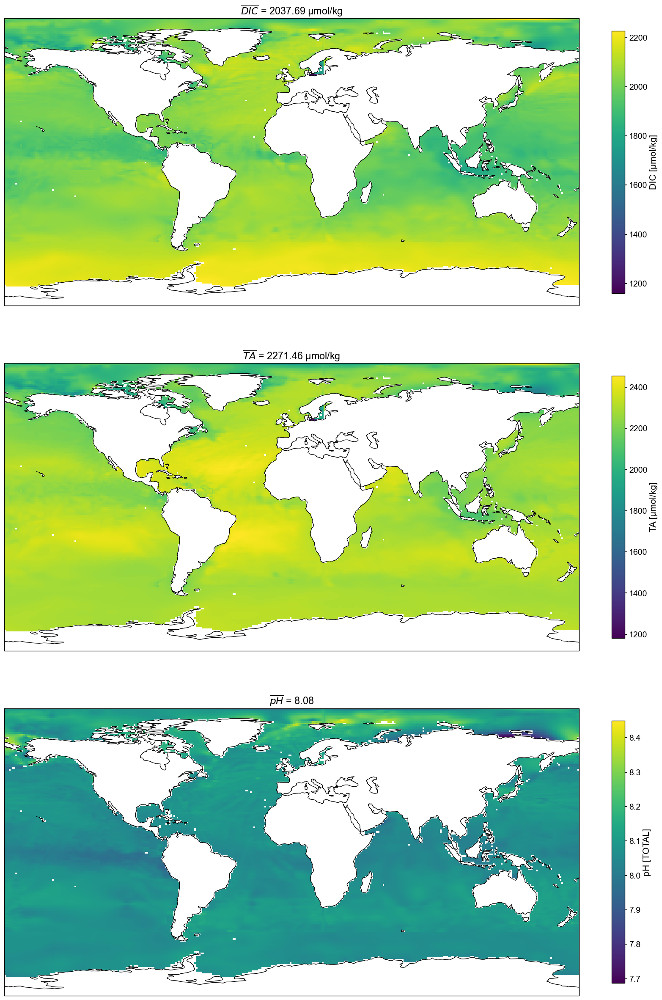

In [227]:
fig, axarr = plt.subplots(nrows = 3, figsize=[20,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [DICdf, TAdf, pHdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{DIC}$ = ', r'$\overline{TA}$ = ', r'$\overline{pH}$ = ']
clabs = ['DIC [µmol/kg]', 'TA [µmol/kg]', 'pH [TOTAL]']
m = 0
for ax in axarr:
    dat = data[m]
    VAR = var[m]
    ax.coastlines()
    im = ax.pcolormesh(dat['longitude'], dat['latitude'], dat[VAR])
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    if m < 2:
        MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    else:
        MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2))
    ax.set_title(MEAN)
    m = m + 1

In [244]:
import cftime
Sidf = pd.read_csv('/Users/akbaskind/Desktop/Data/WOA18_Si.csv')
PO4df = pd.read_csv('/Users/akbaskind/Desktop/Data/WOA18_PO4.csv')
NO3df = pd.read_csv('/Users/akbaskind/Desktop/Data/WOA18_NO3.csv')
DOdf = pd.read_csv('/Users/akbaskind/Desktop/Data/WOA18_DO.csv')
AOUdf = pd.read_csv('/Users/akbaskind/Desktop/Data/WOA18_AOU.csv')

In [245]:
Sidf #.reset_index()

,#COMMA SEPARATED LATITUDE,LONGITUDE,AND VALUES AT DEPTHS (M):0,5,10,15,20,25,30,35,...,4600,4700,4800,4900,5000,5100,5200,5300,5400,5500
0,-77.5,-178.5,58.263,58.127,58.299,58.455,60.041,63.018,65.808,66.482,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-77.5,-177.5,65.366,65.247,65.232,65.538,65.894,66.429,66.927,66.439,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-77.5,-176.5,61.261,61.748,67.006,65.805,64.899,64.782,65.235,65.921,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-77.5,-175.5,56.039,57.187,58.570,59.979,61.348,62.592,63.967,65.381,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-77.5,-174.5,48.399,50.240,52.114,53.846,55.436,56.905,58.230,59.457,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22248,89.5,89.5,NaN,NaN,6.436,6.409,6.383,6.318,5.875,5.181,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22249,89.5,91.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22250,89.5,137.5,NaN,NaN,NaN,4.748,4.627,4.538,4.484,4.510,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22251,89.5,149.5,NaN,NaN,3.795,3.876,3.836,4.115,4.655,5.152,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [254]:
list(Sidf.keys())
# plt.pcolormesh()

['#COMMA SEPARATED LATITUDE',
 ' LONGITUDE',
 'AND VALUES AT DEPTHS (M):0',
 '5',
 '10',
 '15',
 '20',
 '25',
 '30',
 '35',
 '40',
 '45',
 '50',
 '55',
 '60',
 '65',
 '70',
 '75',
 '80',
 '85',
 '90',
 '95',
 '100',
 '125',
 '150',
 '175',
 '200',
 '225',
 '250',
 '275',
 '300',
 '325',
 '350',
 '375',
 '400',
 '425',
 '450',
 '475',
 '500',
 '550',
 '600',
 '650',
 '700',
 '750',
 '800',
 '850',
 '900',
 '950',
 '1000',
 '1050',
 '1100',
 '1150',
 '1200',
 '1250',
 '1300',
 '1350',
 '1400',
 '1450',
 '1500',
 '1550',
 '1600',
 '1650',
 '1700',
 '1750',
 '1800',
 '1850',
 '1900',
 '1950',
 '2000',
 '2100',
 '2200',
 '2300',
 '2400',
 '2500',
 '2600',
 '2700',
 '2800',
 '2900',
 '3000',
 '3100',
 '3200',
 '3300',
 '3400',
 '3500',
 '3600',
 '3700',
 '3800',
 '3900',
 '4000',
 '4100',
 '4200',
 '4300',
 '4400',
 '4500',
 '4600',
 '4700',
 '4800',
 '4900',
 '5000',
 '5100',
 '5200',
 '5300',
 '5400',
 '5500']

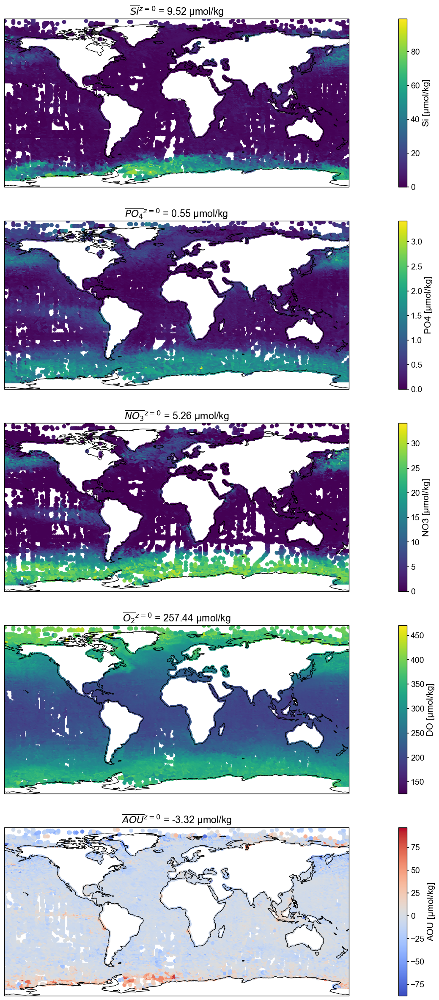

In [256]:
fig, axarr = plt.subplots(nrows = 5, figsize=[30,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [Sidf, PO4df, NO3df, DOdf, AOUdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{Si}^{z = 0}$ = ', r'$\overline{PO_4}^{z = 0}$ = ', 
        r'$\overline{NO_3}^{z = 0}$ = ', r'$\overline{O_2}^{z = 0}$ = ', r'$\overline{AOU}^{z = 0}$ = ']
clabs = ['Si [µmol/kg]', 'PO4 [µmol/kg]', 'NO3 [µmol/kg]', 'DO [µmol/kg]', 'AOU [µmol/kg]']
m = 0
for ax in axarr:
    if m < 4:
        CMAP = 'viridis'
    else:
        CMAP = 'coolwarm'
    dat = data[m]
    ax.coastlines()
    VAR = 'AND VALUES AT DEPTHS (M):0'
    im = ax.scatter(dat[' LONGITUDE'], dat['#COMMA SEPARATED LATITUDE'], c = dat[VAR], cmap = CMAP)
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1


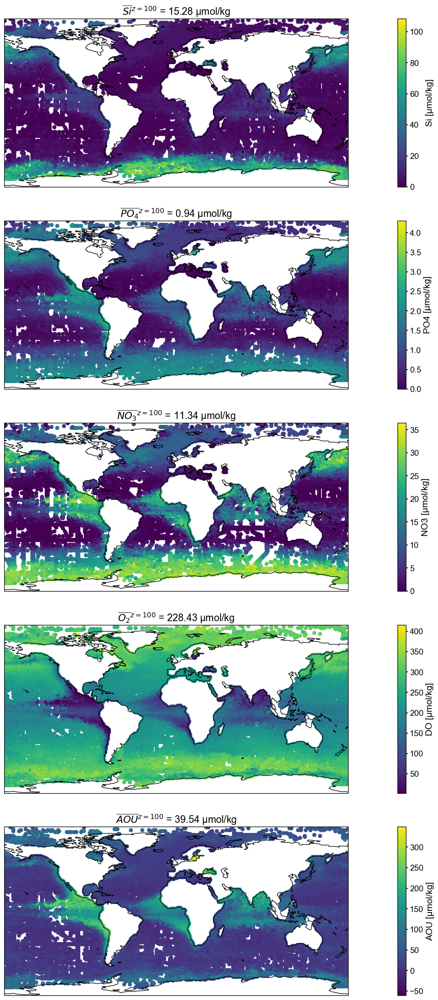

In [259]:
fig, axarr = plt.subplots(nrows = 5, figsize=[30,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [Sidf, PO4df, NO3df, DOdf, AOUdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{Si}^{z = 100}$ = ', r'$\overline{PO_4}^{z = 100}$ = ', 
        r'$\overline{NO_3}^{z = 100}$ = ', r'$\overline{O_2}^{z = 100}$ = ', r'$\overline{AOU}^{z = 100}$ = ']
clabs = ['Si [µmol/kg]', 'PO4 [µmol/kg]', 'NO3 [µmol/kg]', 'DO [µmol/kg]', 'AOU [µmol/kg]']
m = 0
for ax in axarr:
    if m < 4:
        CMAP = 'viridis'
    else:
        CMAP = 'coolwarm'
    dat = data[m]
    ax.coastlines()
    VAR = '100'
    im = ax.scatter(dat[' LONGITUDE'], dat['#COMMA SEPARATED LATITUDE'], c = dat[VAR])
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1


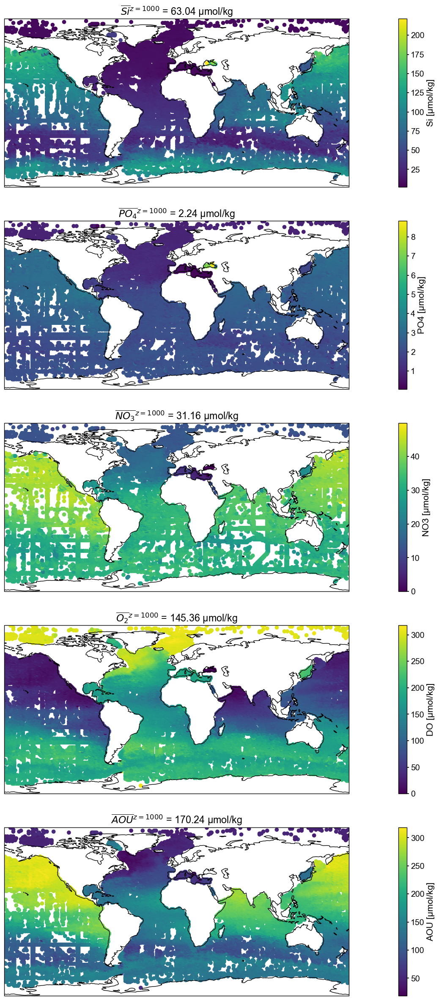

In [260]:
fig, axarr = plt.subplots(nrows = 5, figsize=[30,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [Sidf, PO4df, NO3df, DOdf, AOUdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{Si}^{z = 1000}$ = ', r'$\overline{PO_4}^{z = 1000}$ = ', 
        r'$\overline{NO_3}^{z = 1000}$ = ', r'$\overline{O_2}^{z = 1000}$ = ', r'$\overline{AOU}^{z = 1000}$ = ']
clabs = ['Si [µmol/kg]', 'PO4 [µmol/kg]', 'NO3 [µmol/kg]', 'DO [µmol/kg]', 'AOU [µmol/kg]']
m = 0
for ax in axarr:
    if m < 4:
        CMAP = 'viridis'
    else:
        CMAP = 'coolwarm'
    dat = data[m]
    ax.coastlines()
    VAR = '1000'
    im = ax.scatter(dat[' LONGITUDE'], dat['#COMMA SEPARATED LATITUDE'], c = dat[VAR])
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1


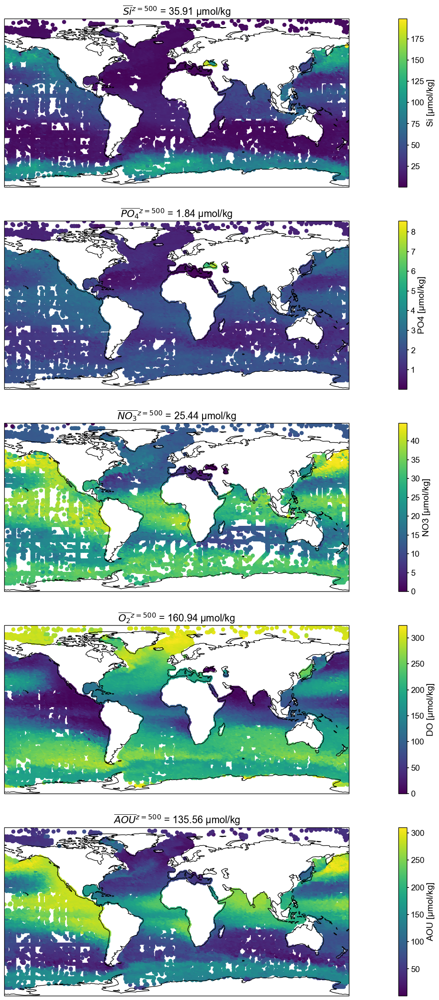

In [261]:
fig, axarr = plt.subplots(nrows = 5, figsize=[30,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [Sidf, PO4df, NO3df, DOdf, AOUdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{Si}^{z = 500}$ = ', r'$\overline{PO_4}^{z = 500}$ = ', 
        r'$\overline{NO_3}^{z = 500}$ = ', r'$\overline{O_2}^{z = 500}$ = ', r'$\overline{AOU}^{z = 500}$ = ']
clabs = ['Si [µmol/kg]', 'PO4 [µmol/kg]', 'NO3 [µmol/kg]', 'DO [µmol/kg]', 'AOU [µmol/kg]']
m = 0
for ax in axarr:
    if m < 4:
        CMAP = 'viridis'
    else:
        CMAP = 'coolwarm'
    dat = data[m]
    ax.coastlines()
    VAR = '500'
    im = ax.scatter(dat[' LONGITUDE'], dat['#COMMA SEPARATED LATITUDE'], c = dat[VAR])
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1


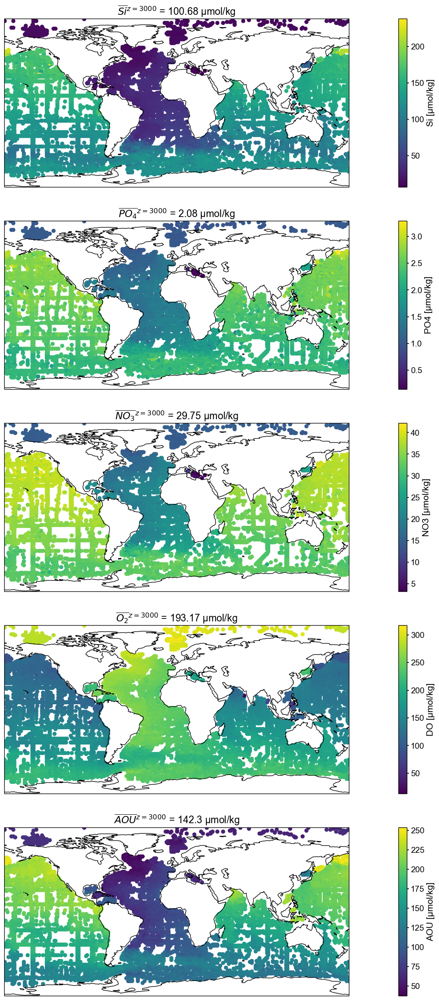

In [262]:
fig, axarr = plt.subplots(nrows = 5, figsize=[30,30], subplot_kw={'projection':ccrs.PlateCarree()})
axarr = axarr.flatten()

data = [Sidf, PO4df, NO3df, DOdf, AOUdf]
var = ['DIC', 'TA', 'pHT']
labs = [r'$\overline{Si}^{z = 3000}$ = ', r'$\overline{PO_4}^{z = 3000}$ = ', 
        r'$\overline{NO_3}^{z = 3000}$ = ', r'$\overline{O_2}^{z = 3000}$ = ', r'$\overline{AOU}^{z = 3000}$ = ']
clabs = ['Si [µmol/kg]', 'PO4 [µmol/kg]', 'NO3 [µmol/kg]', 'DO [µmol/kg]', 'AOU [µmol/kg]']
m = 0
for ax in axarr:
    if m < 4:
        CMAP = 'viridis'
    else:
        CMAP = 'coolwarm'
    dat = data[m]
    ax.coastlines()
    VAR = '3000'
    im = ax.scatter(dat[' LONGITUDE'], dat['#COMMA SEPARATED LATITUDE'], c = dat[VAR])
    cbar = plt.colorbar(im, ax= ax, fraction = 0.02)
    cbar.set_label(clabs[m])
    MEAN = labs[m] + str(round(np.nanmean(dat[VAR]),2)) + ' µmol/kg'
    ax.set_title(MEAN)
    m = m + 1
